In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Import Required Libraries</h1>
</div>

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import warnings
warnings.filterwarnings('ignore')

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Load Dataset</h1>
</div>

In [60]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Dataset OverView</h1>
</div>

In [61]:
print("Train shape:", train.shape)
print("Test shape:", test.shape)

Train shape: (2000, 21)
Test shape: (1000, 21)


In [62]:
train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [63]:
train.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


In [64]:
test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [65]:
train.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [66]:
train.duplicated().sum()

np.int64(0)

In [67]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Statistical Analysis</h1>
</div>

In [68]:
train.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Data Visualization</h1>
</div>

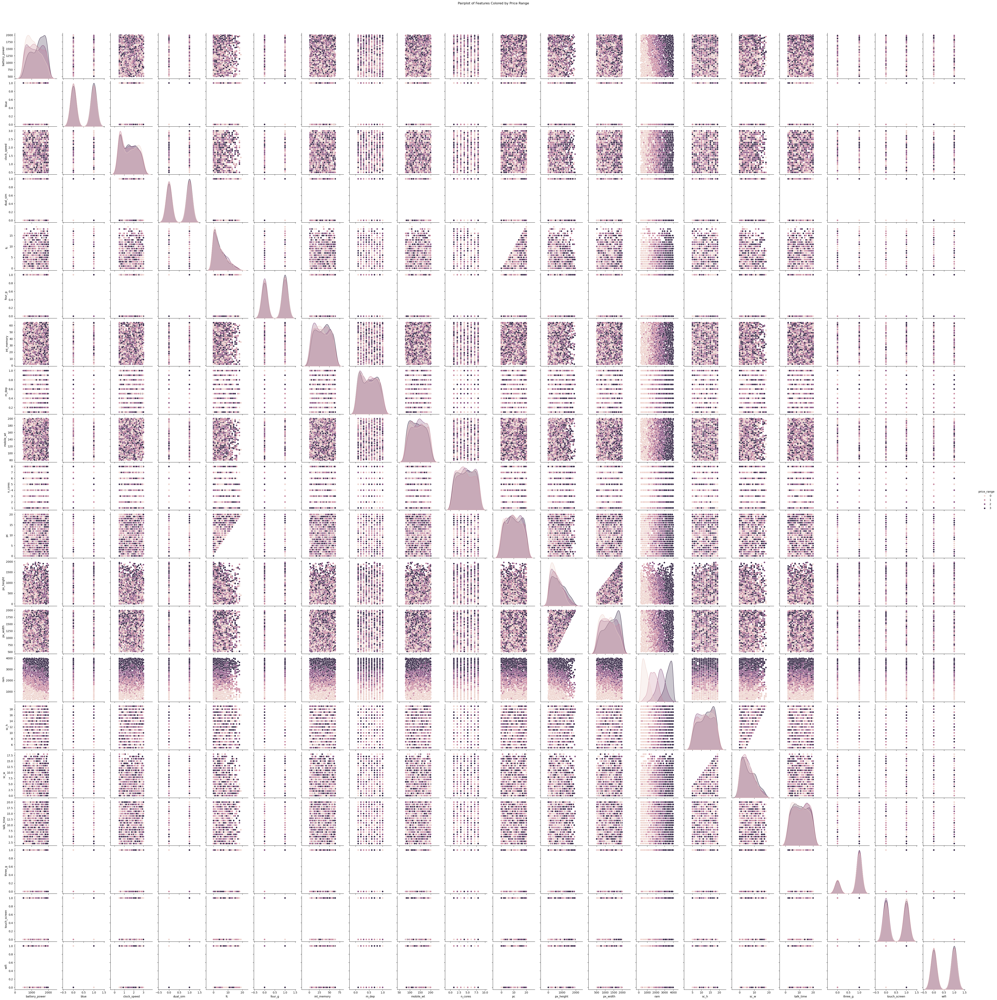

In [69]:
sns.pairplot(train, hue='price_range')
plt.suptitle("Pairplot of Features Colored by Price Range", y=1.02)
plt.show()

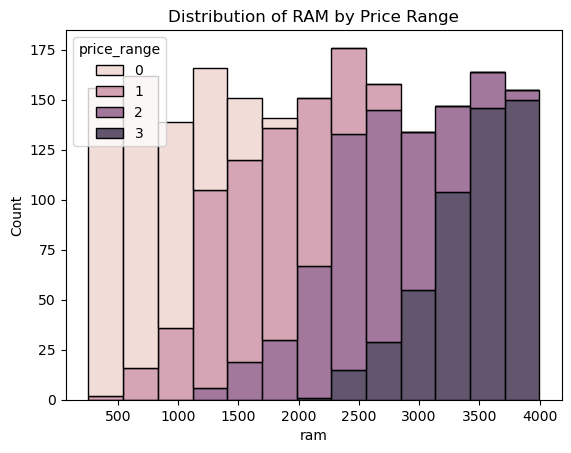

In [70]:
sns.histplot(data=train, x='ram', hue='price_range', multiple='stack')
plt.title("Distribution of RAM by Price Range")
plt.show()

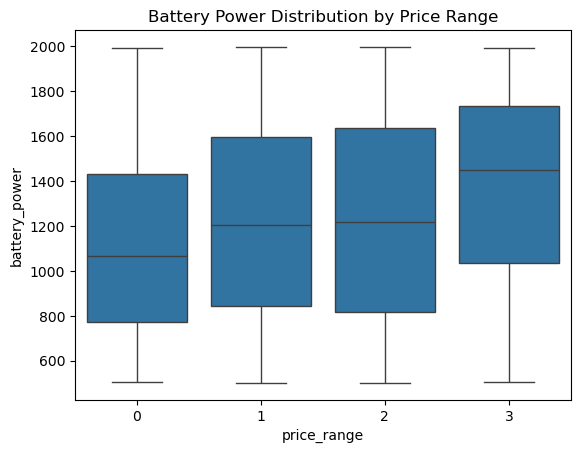

In [71]:
# battery_power vs price_range
sns.boxplot(x='price_range', y='battery_power', data=train)
plt.title("Battery Power Distribution by Price Range")
plt.show()

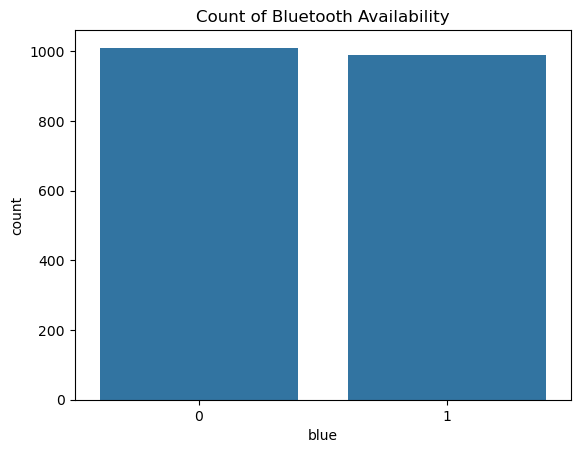

In [72]:
sns.countplot(x='blue', data=train)
plt.title("Count of Bluetooth Availability")
plt.show()

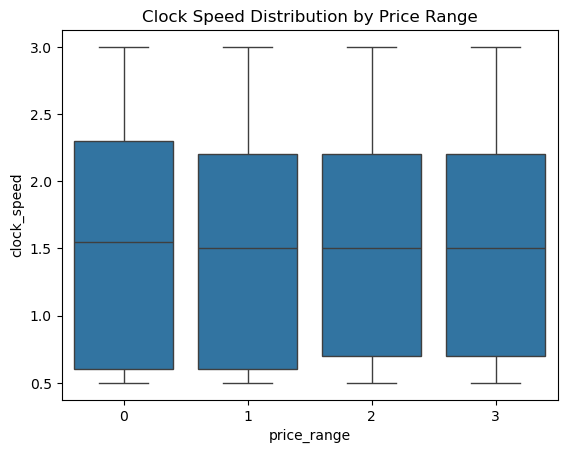

In [73]:
# clock_speed vs price_range
sns.boxplot(x='price_range', y='clock_speed', data=train)
plt.title("Clock Speed Distribution by Price Range")
plt.show()

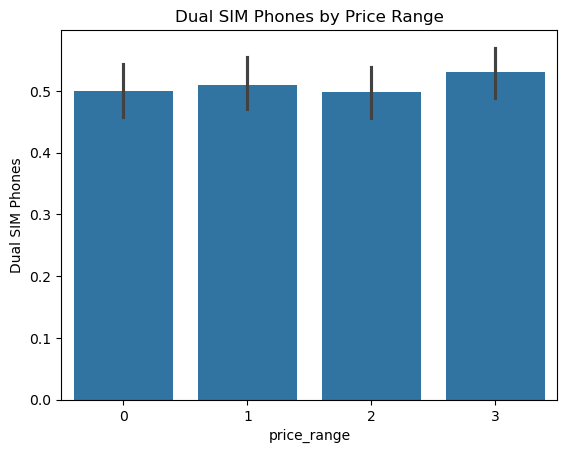

In [74]:
# dual_sim vs price_range bar plot
sns.barplot(x='price_range', y='dual_sim', data=train)
plt.title("Dual SIM Phones by Price Range")
plt.ylabel("Dual SIM Phones")
plt.show()

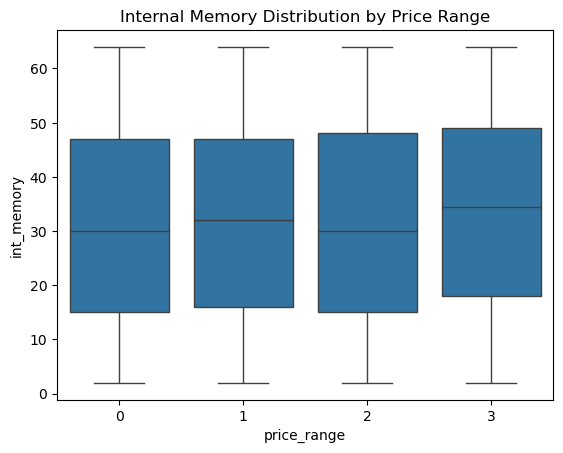

In [75]:
# int_memory vs price_range
sns.boxplot(x='price_range', y='int_memory', data=train)
plt.title("Internal Memory Distribution by Price Range")
plt.show()

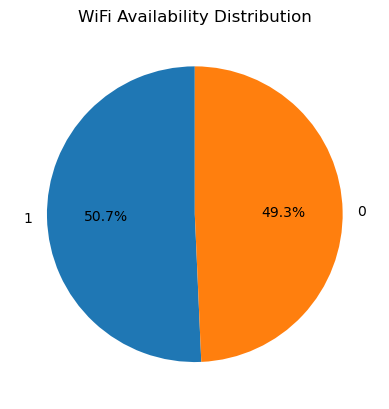

In [76]:
# wifi pie chart
wifi_counts = train['wifi'].value_counts()
plt.pie(wifi_counts, labels=wifi_counts.index, autopct='%1.1f%%', startangle=90)
plt.title("WiFi Availability Distribution")
plt.show()

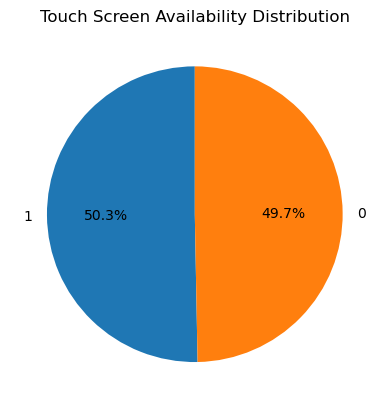

In [77]:
# touch_screen pie chart
touch_screen_counts = train['touch_screen'].value_counts()
plt.pie(touch_screen_counts, labels=touch_screen_counts.index, autopct='%1.1f%%', startangle=90)
plt.title("Touch Screen Availability Distribution")
plt.show()

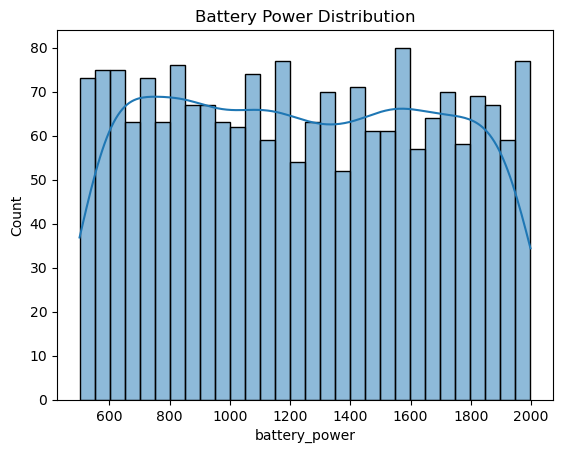

In [78]:
#  battery_power distribution
sns.histplot(train['battery_power'], bins=30, kde=True)
plt.title("Battery Power Distribution")
plt.show()

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Check For Outliers</h1>
</div>

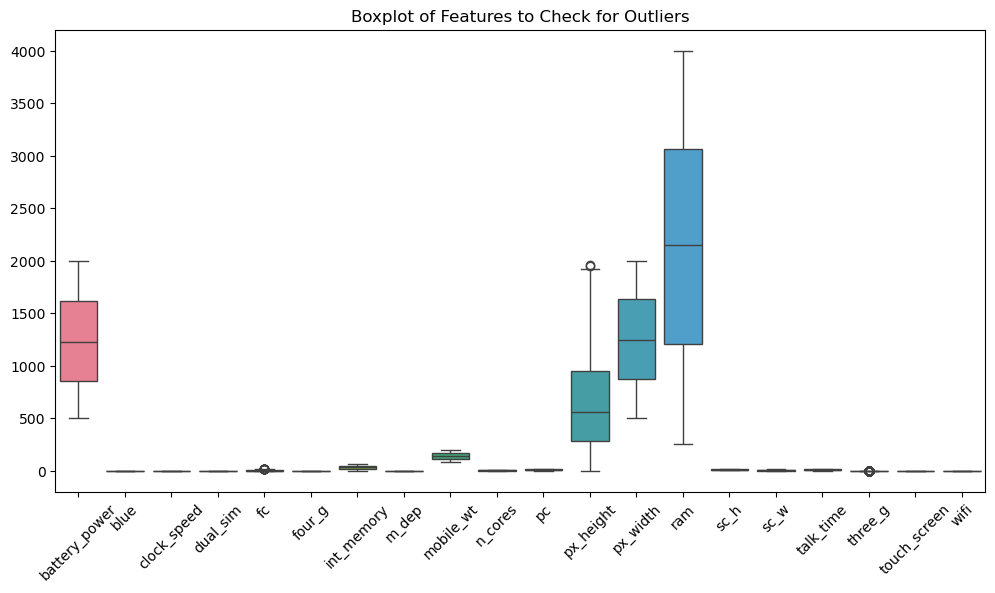

In [79]:
# check outliers
plt.figure(figsize=(12, 6))
sns.boxplot(data=train.drop(columns=['price_range']))
plt.title("Boxplot of Features to Check for Outliers")
plt.xticks(rotation=45)
plt.show()

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Check Class Balanced</h1>
</div>

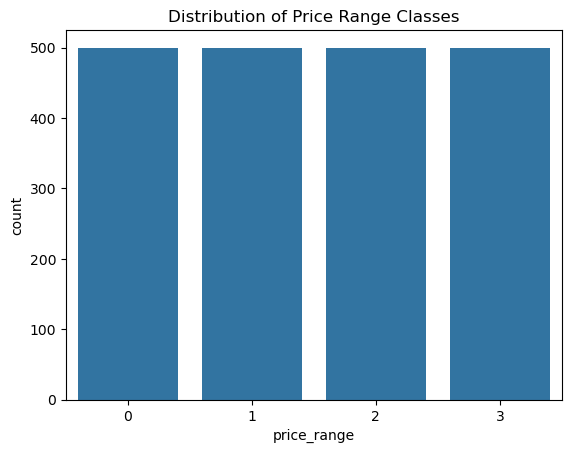

In [80]:
# is data balanced
sns.countplot(x='price_range', data=train)
plt.title("Distribution of Price Range Classes")
plt.show()

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Feature Selection</h1>
</div>

In [81]:
X = train.drop('price_range', axis=1)
y = train['price_range']

<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Data Split</h1>
</div>

In [82]:
# train test split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) 

print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("y_train shape:", y_train.shape)
print("y_val shape:", y_val.shape)

X_train shape: (1600, 20)
X_val shape: (400, 20)
y_train shape: (1600,)
y_val shape: (400,)


<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Data Modeling</h1>
</div>

# Logistic Regression

In [83]:
lr= LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_val)

lr_acc = accuracy_score(y_val, lr_pred)
print("Logistic Regression Accuracy:", lr_acc)
print(classification_report(y_val, lr_pred))
print("Confusion Matrix:\n", confusion_matrix(y_val, lr_pred))

Logistic Regression Accuracy: 0.6675
              precision    recall  f1-score   support

           0       0.90      0.84      0.87       100
           1       0.60      0.59      0.60       100
           2       0.48      0.55      0.51       100
           3       0.73      0.69      0.71       100

    accuracy                           0.67       400
   macro avg       0.68      0.67      0.67       400
weighted avg       0.68      0.67      0.67       400

Confusion Matrix:
 [[84 16  0  0]
 [ 9 59 29  3]
 [ 0 22 55 23]
 [ 0  1 30 69]]


# Random Forest

In [84]:
rf= RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_val)

rf_acc = accuracy_score(y_val, rf_pred)
print("Random Forest Classifier Accuracy:", rf_acc)
print(classification_report(y_val, rf_pred))
print("Confusion Matrix:\n", confusion_matrix(y_val, rf_pred))


Random Forest Classifier Accuracy: 0.88
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       100
           1       0.82      0.84      0.83       100
           2       0.81      0.79      0.80       100
           3       0.93      0.93      0.93       100

    accuracy                           0.88       400
   macro avg       0.88      0.88      0.88       400
weighted avg       0.88      0.88      0.88       400

Confusion Matrix:
 [[96  4  0  0]
 [ 5 84 11  0]
 [ 0 14 79  7]
 [ 0  0  7 93]]


# Decision Tree

In [85]:
dt= DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)
dt_pred = dt.predict(X_val)

dt_acc = accuracy_score(y_val, dt_pred)
print("Decision Tree Classifier Accuracy:", dt_acc)
print(classification_report(y_val, dt_pred))
print("Confusion Matrix:\n", confusion_matrix(y_val, dt_pred))

Decision Tree Classifier Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       100
           1       0.78      0.74      0.76       100
           2       0.75      0.80      0.77       100
           3       0.92      0.86      0.89       100

    accuracy                           0.83       400
   macro avg       0.83      0.83      0.83       400
weighted avg       0.83      0.83      0.83       400

Confusion Matrix:
 [[92  8  0  0]
 [13 74 13  0]
 [ 0 13 80  7]
 [ 0  0 14 86]]


# XGBoost

In [91]:
xgb= XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb.fit(X_train, y_train)
xgb_pred = xgb.predict(X_val)

xgb_acc = accuracy_score(y_val, xgb_pred)
print("XGBoost Classifier Accuracy:", xgb_acc)
print(classification_report(y_val, xgb_pred))
print("Confusion Matrix:\n", confusion_matrix(y_val, xgb_pred))

XGBoost Classifier Accuracy: 0.935
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       100
           1       0.94      0.93      0.93       100
           2       0.87      0.90      0.89       100
           3       0.96      0.91      0.93       100

    accuracy                           0.94       400
   macro avg       0.94      0.94      0.93       400
weighted avg       0.94      0.94      0.93       400

Confusion Matrix:
 [[100   0   0   0]
 [  3  93   4   0]
 [  0   6  90   4]
 [  0   0   9  91]]


<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Cross Validation</h1>
</div>

# logistic regression

In [86]:
# logistic regression cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
lr_cv_scores = cross_val_score(lr, X, y, cv=kf, scoring='accuracy')
print("Logistic Regression Cross-Validation Accuracy Scores:", lr_cv_scores)
print("Mean CV Accuracy:", np.mean(lr_cv_scores))

Logistic Regression Cross-Validation Accuracy Scores: [0.71   0.72   0.6875 0.7075 0.665 ]
Mean CV Accuracy: 0.698


# Decision tree

In [87]:
# decision tree cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
dt_cv_scores = cross_val_score(dt, X, y, cv=kf, scoring='accuracy')
print("Decision Tree Cross-Validation Accuracy Scores:", dt_cv_scores)
print("Mean CV Accuracy:", np.mean(dt_cv_scores))

Decision Tree Cross-Validation Accuracy Scores: [0.8325 0.8375 0.84   0.8225 0.82  ]
Mean CV Accuracy: 0.8305


# Random Forest

In [88]:
# random forest cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
rf_cv_scores = cross_val_score(rf, X, y, cv=kf, scoring='accuracy')
print("Random Forest Cross-Validation Accuracy Scores:", rf_cv_scores)
print("Mean CV Accuracy:", np.mean(rf_cv_scores))

Random Forest Cross-Validation Accuracy Scores: [0.8925 0.88   0.87   0.875  0.865 ]
Mean CV Accuracy: 0.8765000000000001


# xgboost

In [ ]:
# xgboost cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
xgb_cv_scores = cross_val_score(xgb, X, y, cv=kf, scoring='accuracy')
print("XGBoost Cross-Validation Accuracy Scores:", xgb_cv_scores)
print("Mean CV Accuracy:", np.mean(xgb_cv_scores))

XGBoost Cross-Validation Accuracy Scores: [0.905  0.9175 0.905  0.905  0.89  ]
Mean CV Accuracy: 0.9045


<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Hyperparameter Tunning</h1>
</div>

# Random Forest

In [89]:
# random forest hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X, y)
print("Best Hyperparameters:", grid_search.best_params_)
print("Best Cross-Validation Accuracy:", grid_search.best_score_)

Best Hyperparameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Best Cross-Validation Accuracy: 0.884


# xgboost

In [ ]:
# xgboost hyperparameter tuning
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.1, 0.2],
}
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, cv=5, scoring='accuracy', n_jobs=-1)
grid_search_xgb.fit(X, y)
print("Best Hyperparameters for XGBoost:", grid_search_xgb.best_params_)
print("Best Cross-Validation Accuracy for XGBoost:", grid_search_xgb.best_score_)


Best Hyperparameters for XGBoost: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}
Best Cross-Validation Accuracy for XGBoost: 0.915


<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Fit Model</h1>
</div>

In [94]:
best_xgb = grid_search_xgb.best_estimator_
best_xgb.fit(X_train, y_train)
best_xgb_pred = best_xgb.predict(X_val)
best_xgb_acc = accuracy_score(y_val, best_xgb_pred)
print("Tuned XGBoost Classifier Accuracy:", best_xgb_acc)
print(classification_report(y_val, best_xgb_pred))
print("Confusion Matrix:\n", confusion_matrix(y_val, best_xgb_pred))

Tuned XGBoost Classifier Accuracy: 0.935
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       100
           1       0.92      0.93      0.93       100
           2       0.91      0.89      0.90       100
           3       0.95      0.94      0.94       100

    accuracy                           0.94       400
   macro avg       0.93      0.94      0.93       400
weighted avg       0.93      0.94      0.93       400

Confusion Matrix:
 [[98  2  0  0]
 [ 4 93  3  0]
 [ 0  6 89  5]
 [ 0  0  6 94]]


<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">Final Submission</h1>
</div>

In [97]:
# test set predictions with the best model
test_features = test.drop(columns=['id'])
test_pred = best_xgb.predict(test_features)
submission = pd.DataFrame({'id': test['id'], 'price_range': test_pred})
submission.to_csv('submission.csv', index=False)

print("Submission file created: submission.csv")
print("Best model used for submission: Tuned XGBoost Classifier")

Submission file created: submission.csv
Best model used for submission: Tuned XGBoost Classifier


In [98]:
submission.head()

,id,price_range
0,1,3
1,2,3
2,3,2
3,4,3
4,5,1


<div style="border-radius: 100px 100px 0px 0px; border: 2px solid black; padding: 20px; background-color: green; text-align: center; box-shadow: 0px 2px 4px yellow;width:95%">
    <h1 style="color: yellow; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 36px;">The End..........</h1>
</div>